In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("fernando2rad/x-ray-lung-diseases-images-9-classes")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/x-ray-lung-diseases-images-9-classes


## **Data Preprocessing**

In [2]:
import os
import cv2
import numpy as np
from tqdm import tqdm

def preprocess_images(source_folder, target_folder, img_size=(256, 256)):
    categories = os.listdir(source_folder)
    for category in categories:
        img_paths = os.listdir(os.path.join(source_folder, category))
        os.makedirs(os.path.join(target_folder, category), exist_ok=True)
        for img_name in tqdm(img_paths, desc=f"Processing {category}"):
            img_path = os.path.join(source_folder, category, img_name)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # Read as grayscale
            img_resized = cv2.resize(img, img_size)  # Resize image
            cv2.imwrite(os.path.join(target_folder, category, img_name), img_resized)  # Save preprocessed image

# Usage
source_dir = '/kaggle/input/x-ray-lung-diseases-images-9-classes'
target_dir = '/kaggle/processed/x-ray-lung-diseases-images'
preprocess_images(source_dir, target_dir)


Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia): 100%|██████████| 644/644 [00:06<00:00, 105.65it/s]
Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema): 100%|██████████| 678/678 [00:05<00:00, 124.32it/s]
Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio): 100%|██████████| 629/629 [00:05<00:00, 118.08it/s]
Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias): 100%|██████████| 544/544 [00:04<00:00, 116.32it/s]
Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases): 100%|██████████| 658/658 [00:05<00:00, 122.74it/s]
Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose): 100%|██████████| 594/594 [00:04<00:00, 139.80it/s]
Processing 00 Anatomia Normal: 100%|██████████| 1340/1340 [00:11<00:00, 118.34it/s]
Processing 07 Alterações de Mediastino (Pericardite, Malfo

## **Exploratory Data Analysis (EDA)**

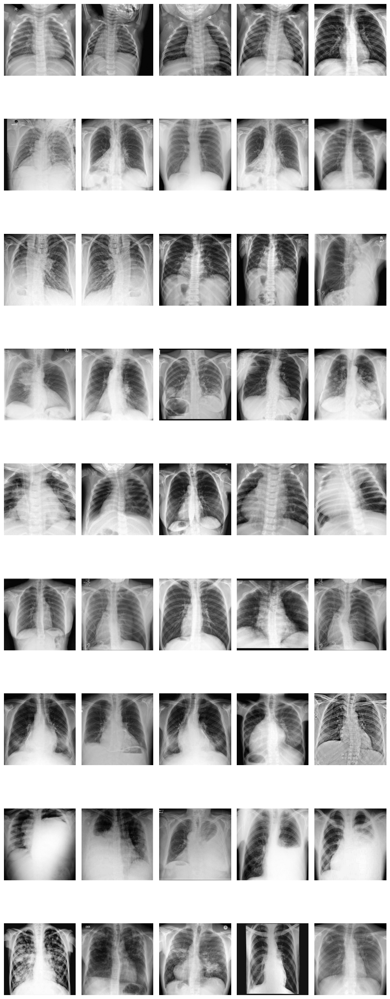

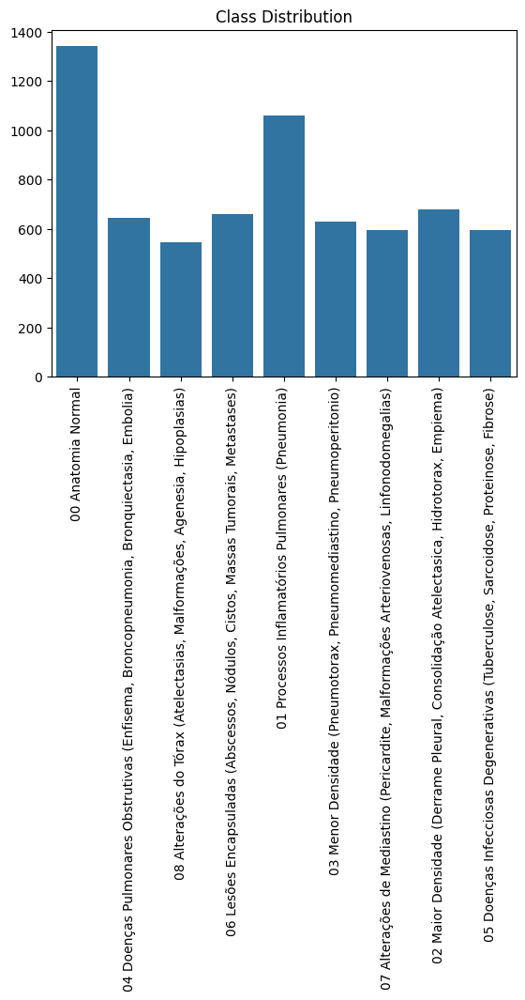

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_sample_images(data_folder, num_samples=5):
    categories = os.listdir(data_folder)
    fig, axs = plt.subplots(len(categories), num_samples, figsize=(num_samples * 2, len(categories) * 3))
    for i, category in enumerate(categories):
        images = os.listdir(os.path.join(data_folder, category))[:num_samples]
        for j, image in enumerate(images):
            img_path = os.path.join(data_folder, category, image)
            img = plt.imread(img_path)
            axs[i, j].imshow(img, cmap='gray')
            axs[i, j].axis('off')
        axs[i, 0].set_ylabel(category)
    plt.tight_layout()
    plt.show()

def plot_class_distribution(data_folder):
    categories = os.listdir(data_folder)
    counts = [len(os.listdir(os.path.join(data_folder, cat))) for cat in categories]
    sns.barplot(x=categories, y=counts)
    plt.title('Class Distribution')
    plt.xticks(rotation=90)
    plt.show()





# Usage
plot_sample_images(target_dir)
plot_class_distribution(target_dir)


## **check for corrupted images**

In [40]:
import os
import cv2
import numpy as np
from tqdm import tqdm

def preprocess_images(source_folder, target_folder, img_size=(256, 256)):
    # Define the categories by listing all subdirectories in the source folder
    categories = os.listdir(source_folder)

    for category in categories:
        # Define the full path to the category directory
        category_path = os.path.join(source_folder, category)

        # Skip if it's not a directory
        if not os.path.isdir(category_path):
            continue

        img_paths = os.listdir(category_path)

        # Create target folder for the category
        os.makedirs(os.path.join(target_folder, category), exist_ok=True)

        for img_name in tqdm(img_paths, desc=f"Processing {category}"):
            img_path = os.path.join(category_path, img_name)

            # Read image as grayscale
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            if img is None:
                continue  # Skip the image if it is corrupted or unreadable

            # Resize image
            img_resized = cv2.resize(img, img_size)

            # Save the preprocessed image
            cv2.imwrite(os.path.join(target_folder, category, img_name), img_resized)

# Usage
source_dir = '/kaggle/input/x-ray-lung-diseases-images-9-classes'
target_dir = '/kaggle/processed/x-ray-lung-diseases-images'
preprocess_images(source_dir, target_dir)


Processing 04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia): 100%|██████████| 644/644 [00:02<00:00, 266.82it/s]
Processing 02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema): 100%|██████████| 678/678 [00:02<00:00, 297.29it/s]
Processing 03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio): 100%|██████████| 629/629 [00:01<00:00, 392.19it/s]
Processing 08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias): 100%|██████████| 544/544 [00:01<00:00, 446.99it/s]
Processing 06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases): 100%|██████████| 658/658 [00:01<00:00, 494.62it/s]
Processing 05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose): 100%|██████████| 594/594 [00:01<00:00, 482.78it/s]
Processing 00 Anatomia Normal: 100%|██████████| 1340/1340 [00:03<00:00, 345.99it/s]
Processing 07 Alterações de Mediastino (Pericardite, Malfo

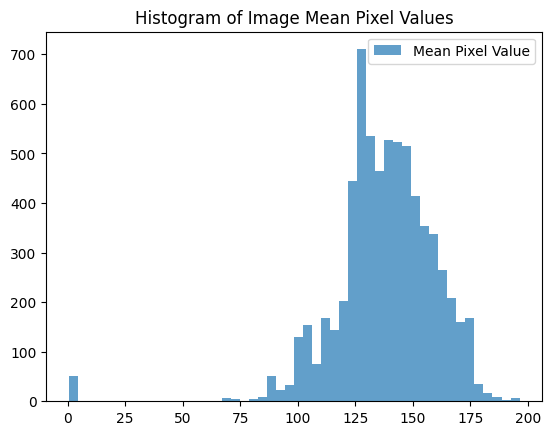

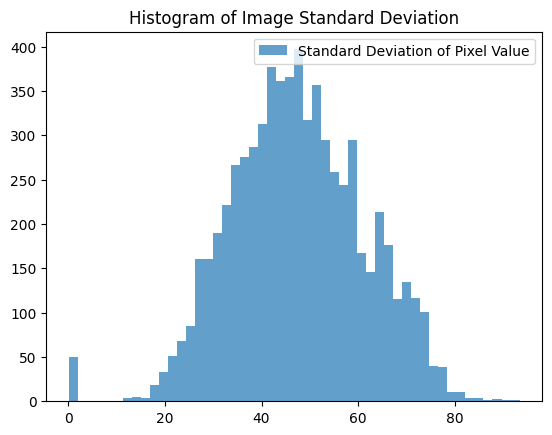

In [43]:
import os
import numpy as np
import matplotlib.pyplot as plt

# Define data folder
data_folder = '/kaggle/input/x-ray-lung-diseases-images-9-classes'  # Example path, replace with your actual path

# Define categories by listing all subdirectories (classes) in the data folder
categories = os.listdir(data_folder)

# Initialize lists to store mean and std values
means = []
std_devs = []

# Iterate through each category and its images
for category in categories:
    category_path = os.path.join(data_folder, category)

    # Skip if not a directory
    if not os.path.isdir(category_path):
        continue

    img_paths = os.listdir(category_path)

    for img_name in img_paths:
        img_path = os.path.join(category_path, img_name)
        img = plt.imread(img_path)

        # Ensure the image is not corrupted
        if img is None:
            continue

        # Compute mean and standard deviation for the image
        means.append(np.mean(img))
        std_devs.append(np.std(img))

# Plot histogram for mean pixel values
plt.hist(means, bins=50, alpha=0.7, label='Mean Pixel Value')
plt.legend(loc='best')
plt.title('Histogram of Image Mean Pixel Values')
plt.show()

# Plot histogram for standard deviation of pixel values
plt.hist(std_devs, bins=50, alpha=0.7, label='Standard Deviation of Pixel Value')
plt.legend(loc='best')
plt.title('Histogram of Image Standard Deviation')
plt.show()


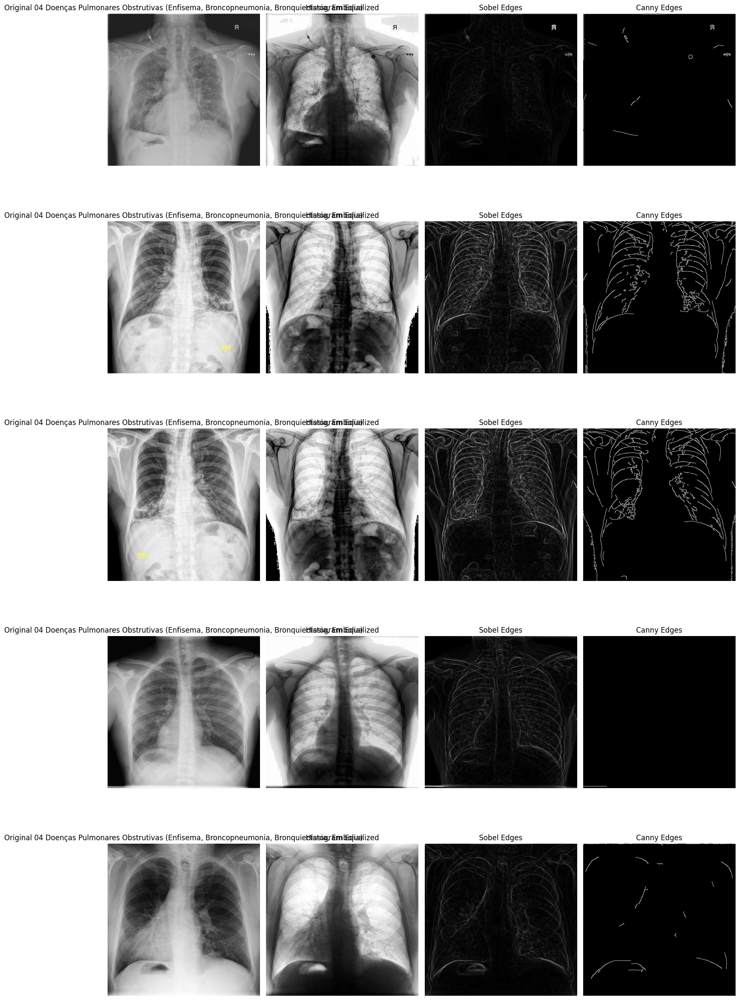

In [55]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import random

)
data_folder =  '/kaggle/input/x-ray-lung-diseases-images-9-classes'
categories = os.listdir(data_folder)


def apply_hist_eq(img):
    # Convert to grayscale
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)


    img = np.uint8(img * 255)  # Convert to the range [0, 255]

    # Apply Histogram Equalization
    equalized_img = cv2.equalizeHist(img)
    return equalized_img

# Function to apply Sobel edge detection
def apply_sobel_edge_detection(img):

    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Apply Sobel filter to detect edges
    sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)

    # Combine the results from both directions (x and y)
    sobel_edges = cv2.magnitude(sobel_x, sobel_y)
    return sobel_edges

# Function to apply Canny edge detection
def apply_canny_edge_detection(img):
    # Convert to grayscale
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)


    img = np.uint8(img * 255)  # Convert to the range [0, 255]

    # Apply Canny edge detection
    canny_edges = cv2.Canny(img, 100, 200)
    return canny_edges

# Function to select random images
def select_images_randomly(categories, num_images=5):
    sample_images = []
    sample_titles = []

    selected_categories = random.sample(categories, 2)


    for category in selected_categories:
        category_path = os.path.join(data_folder, category)
        img_paths = os.listdir(category_path)


        selected_img_paths = random.sample(img_paths, num_images)

        for img_name in selected_img_paths:
            img_path = os.path.join(category_path, img_name)
            img = plt.imread(img_path)

            # Apply histogram equalization
            hist_eq_img = apply_hist_eq(img)

            # Apply Sobel edge detection
            sobel_edges = apply_sobel_edge_detection(img)

            # Apply Canny edge detection
            canny_edges = apply_canny_edge_detection(img)

            # Store the images and their titles
            sample_images.append([img, hist_eq_img, sobel_edges, canny_edges])
            sample_titles.append([f"Original {category}", "Histogram Equalized", "Sobel Edges", "Canny Edges"])

            if len(sample_images) >= num_images * len(selected_categories):
                break

    return sample_images, sample_titles


sample_images, sample_titles = select_images_randomly(categories, num_images=5)

# Plotting the processed images
def plot_images(images, titles, num_images=5):
    fig, axs = plt.subplots(num_images, 4, figsize=(15, 5 * num_images))
    for i in range(num_images):
        for j in range(4):
            axs[i, j].imshow(images[i][j], cmap='gray')
            axs[i, j].set_title(titles[i][j])
            axs[i, j].axis('off')
    plt.tight_layout()
    plt.show()

# Plot the processed images
plot_images(sample_images, sample_titles, num_images=5)


## **Setting Up Data Generators**

In [5]:
import os
import shutil
from sklearn.model_selection import train_test_split

def split_dataset(source_dir, output_dir, train_ratio=0.7, val_ratio=0.15):
    classes = os.listdir(source_dir)

    for class_name in classes:
        class_path = os.path.join(source_dir, class_name)
        images = os.listdir(class_path)
        train_val, test = train_test_split(images, test_size=1 - (train_ratio + val_ratio), random_state=42)
        train, val = train_test_split(train_val, test_size=val_ratio / (train_ratio + val_ratio), random_state=42)

        for split_name, split_data in zip(['train', 'val', 'test'], [train, val, test]):
            split_class_dir = os.path.join(output_dir, split_name, class_name)
            os.makedirs(split_class_dir, exist_ok=True)
            for img in split_data:
                src = os.path.join(class_path, img)
                dst = os.path.join(split_class_dir, img)
                shutil.copy(src, dst)

# Usage:
processed_source = '/kaggle/input/x-ray-lung-diseases-images-9-classes'
processed_output = '/kaggle/working/xray_split'
split_dataset(processed_source, processed_output)


In [6]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Set up augmentation for training
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
)

val_datagen = ImageDataGenerator(rescale=1./255)

test_datagen = ImageDataGenerator(rescale=1./255)

# Set up data generators
train_generator = train_datagen.flow_from_directory(
    directory=os.path.join(processed_output, 'train'),
    target_size=(256, 256),
    color_mode='grayscale',
    class_mode='categorical',
    batch_size=32,
    shuffle=True
)

val_generator = val_datagen.flow_from_directory(
    directory=os.path.join(processed_output, 'val'),
    target_size=(256, 256),
    color_mode='grayscale',
    class_mode='categorical',
    batch_size=32,
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
    directory=os.path.join(processed_output, 'test'),
    target_size=(256, 256),
    color_mode='grayscale',
    class_mode='categorical',
    batch_size=32,
    shuffle=False
)


Found 4712 images belonging to 9 classes.
Found 1014 images belonging to 9 classes.
Found 1017 images belonging to 9 classes.


# ***MODEL 1***

https://www.sciencedirect.com/science/article/pii/S2772442523000734#d1e1187

In [6]:
# Example: Pneumothorax vs. Normal
selected_classes = ['Pneumothorax', 'Normal']


In [7]:
import tensorflow as tf
from tensorflow.keras import layers, models

def build_model(input_shape=(256, 256, 1)):
    inputs = tf.keras.Input(shape=input_shape, name='input_layer')

    x = layers.Conv2D(32, (3, 3), activation='relu', name='conv2d_1')(inputs)
    x = layers.Conv2D(64, (3, 3), activation='relu', name='conv2d_2')(x)
    x = layers.MaxPooling2D((2, 2), name='max_pooling2d_1')(x)
    x = layers.Dropout(0.25, name='dropout_1')(x)

    x = layers.Conv2D(64, (3, 3), activation='relu', name='conv2d_3')(x)
    x = layers.MaxPooling2D((2, 2), name='max_pooling2d_2')(x)
    x = layers.Dropout(0.25, name='dropout_2')(x)

    x = layers.Conv2D(128, (3, 3), activation='relu', name='conv2d_4')(x)
    x = layers.MaxPooling2D((2, 2), name='max_pooling2d_3')(x)
    x = layers.Dropout(0.25, name='dropout_3')(x)

    x = layers.Conv2D(128, (3, 3), activation='relu', name='conv2d_5')(x)
    x = layers.MaxPooling2D((2, 2), name='max_pooling2d_4')(x)
    x = layers.Dropout(0.25, name='dropout_4')(x)

    x = layers.Flatten(name='flatten')(x)
    x = layers.Dense(64, activation='relu', name='dense_1')(x)
    x = layers.Dropout(0.5, name='dropout_5')(x)
    outputs = layers.Dense(1, activation='sigmoid', name='output')(x)

    model = models.Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    return model



In [8]:
# Initialize the model
model = build_model()
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 256, 256, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 254, 254, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 252, 252, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 126, 126, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 126, 126, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 124, 124, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 60, 60, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 30, 30, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 30, 30, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 28, 28, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │     1,605,696 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,882,945 (7.18 MB)

 Trainable params: 1,882,945 (7.18 MB)

 Non-trainable params: 0 (0.00 B)

In [9]:
import os

print(os.listdir('/kaggle/working/xray_split/train'))  # Print to confirm folder names


['00 Anatomia Normal', '04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia)', '08 Alterações do Tórax (Atelectasias, Malformações, Agenesia, Hipoplasias)', '06 Lesões Encapsuladas (Abscessos, Nódulos, Cistos, Massas Tumorais, Metastases)', '01 Processos Inflamatórios Pulmonares (Pneumonia)', '03 Menor Densidade (Pneumotorax, Pneumomediastino, Pneumoperitonio)', '07 Alterações de Mediastino (Pericardite, Malformações Arteriovenosas, Linfonodomegalias)', '02 Maior Densidade (Derrame Pleural, Consolidação Atelectasica, Hidrotorax, Empiema)', '05 Doenças Infecciosas Degenerativas (Tuberculose, Sarcoidose, Proteinose, Fibrose)']


In [10]:
selected_classes = [
    '00 Anatomia Normal',
    '04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia)'
]


In [11]:
train_generator = train_datagen.flow_from_directory(
    '/kaggle/working/xray_split/train',
    target_size=(256, 256),
    color_mode='grayscale',
    classes=selected_classes,
    class_mode='binary',
    batch_size=32
)

val_generator = val_datagen.flow_from_directory(
    '/kaggle/working/xray_split/val',
    target_size=(256, 256),
    color_mode='grayscale',
    classes=selected_classes,
    class_mode='binary',
    batch_size=32
)

test_generator = test_datagen.flow_from_directory(
    '/kaggle/working/xray_split/val',
    target_size=(256, 256),
    color_mode='grayscale',
    classes=selected_classes,
    class_mode='binary',
    batch_size=32
)


Found 1387 images belonging to 2 classes.
Found 298 images belonging to 2 classes.
Found 298 images belonging to 2 classes.


In [12]:
from tensorflow.keras.callbacks import EarlyStopping

early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history = model.fit(
    train_generator,
    epochs=30,
    validation_data=val_generator,
    callbacks=[early_stop]
)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 44s 578ms/step - accuracy: 0.6151 - loss: 0.7177 - val_accuracy: 0.6745 - val_loss: 0.6480
Epoch 2/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 11s 255ms/step - accuracy: 0.6628 - loss: 0.6336 - val_accuracy: 0.6745 - val_loss: 0.5491
Epoch 3/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 11s 237ms/step - accuracy: 0.7105 - loss: 0.5513 - val_accuracy: 0.8322 - val_loss: 0.4137
Epoch 4/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 11s 239ms/step - accuracy: 0.7815 - loss: 0.4551 - val_accuracy: 0.8356 - val_loss: 0.4181
Epoch 5/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 11s 246ms/step - accuracy: 0.7675 - loss: 0.4425 - val_accuracy: 0.8624 - val_loss: 0.3719
Epoch 6/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 11s 245ms/step - accuracy: 0.8218 - loss: 0.4283 - val_accuracy: 0.8423 - val_loss: 0.4064
Epoch 7/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 11s 245ms/step - accuracy: 0.8411 - loss: 0.4199 - val_accuracy: 0.8591 - val_loss: 0.3459
Epoch 8/30
44/44 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - accuracy: 0.8350 - loss: 0.3864 - val_accu

In [13]:
model.save('/kaggle/working/my_trained_model.h5')


In [14]:
loss, acc = model.evaluate(val_generator)
print(f"Validation Accuracy: {acc:.4f}, Loss: {loss:.4f}")


10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9357 - loss: 0.1819
Validation Accuracy: 0.9329, Loss: 0.1711


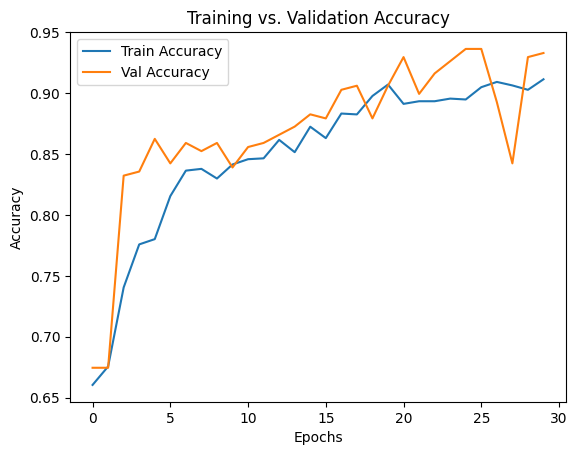

In [15]:
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training vs. Validation Accuracy')
plt.show()


In [16]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(test_generator)

print(f"Test Accuracy: {test_acc:.4f}, Test Loss: {test_loss:.4f}")


10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.9416 - loss: 0.1669
Test Accuracy: 0.9329, Test Loss: 0.1711


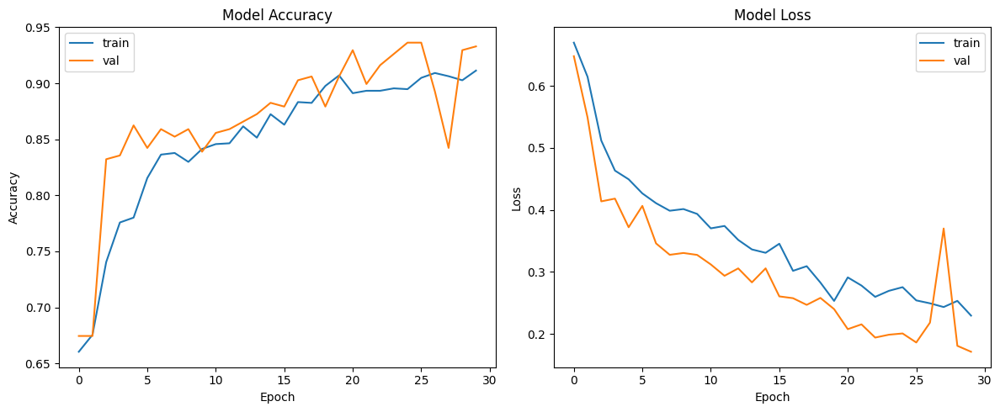

In [17]:
# Plot accuracy and loss
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot Accuracy
axes[0].plot(history.history['accuracy'], label='train')
axes[0].plot(history.history['val_accuracy'], label='val')
axes[0].set_title('Model Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

# Plot Loss
axes[1].plot(history.history['loss'], label='train')
axes[1].plot(history.history['val_loss'], label='val')
axes[1].set_title('Model Loss')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].legend()

plt.tight_layout()
plt.show()

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step


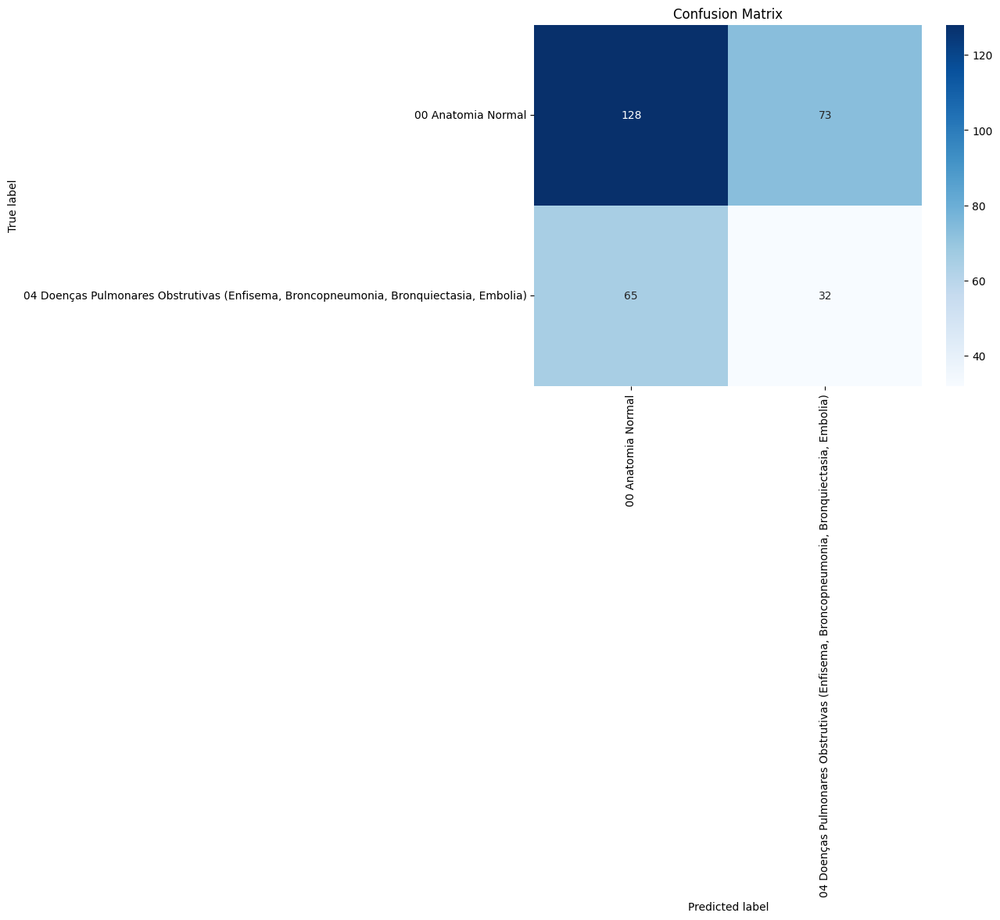

In [18]:
from sklearn.metrics import confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Get the true labels for the test set
y_true = test_generator.classes  # True labels from the test set

# Get the model's predictions
y_pred = model.predict(test_generator)
y_pred = np.round(y_pred).astype(int)  # Convert probabilities to binary class labels (0 or 1)

# Generate the confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues', cbar=True,
            xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')
plt.show()


In [20]:
import pandas as pd
from sklearn.metrics import confusion_matrix
import numpy as np
from tensorflow.keras.models import load_model

# Assuming 'model' is your trained model
model = load_model('/kaggle/working/my_trained_model.h5')
  # Replace with your actual trained model path

# Function to calculate TP, TN, FP, FN
def calculate_metrics(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    TP = cm[1, 1]  # True Positive
    TN = cm[0, 0]  # True Negative
    FP = cm[0, 1]  # False Positive
    FN = cm[1, 0]  # False Negative
    accuracy = (TP + TN) / (TP + TN + FP + FN) * 100  # Accuracy calculation
    return TP, TN, FP, FN, accuracy

# List to store results for each case
results = []

# Define selected classes for binary classification (your specified classes)
selected_classes = [
    '00 Anatomia Normal',
    '04 Doenças Pulmonares Obstrutivas (Enfisema, Broncopneumonia, Bronquiectasia, Embolia)'
]

# Loop over different image resolutions
resolutions = [(120, 120), (150, 150), (180, 180), (224, 224)]  # Update with actual resolutions
for resolution in resolutions:
    img_size = resolution



    # Evaluate on the train data
    y_true_train = train_generator.classes  # True labels from the train data
    y_pred_train = model.predict(train_generator)  # Model predictions for the train data
    y_pred_train = np.round(y_pred_train).astype(int)  # Convert predictions to binary labels

    # Get the metrics for train data
    TP_train, TN_train, FP_train, FN_train, acc_train = calculate_metrics(y_true_train, y_pred_train)

    # Evaluate on the test data
    y_true_test = test_generator.classes  # True labels from the test data
    y_pred_test = model.predict(test_generator)  # Model predictions for the test data
    y_pred_test = np.round(y_pred_test).astype(int)  # Convert predictions to binary labels

    TP_test, TN_test, FP_test, FN_test, acc_test = calculate_metrics(y_true_test, y_pred_test)

    # Store the results for both train and test data in the results list (9 columns now)
    results.append([ img_size[0], img_size[1], len(train_generator.classes), TP_train, TN_train, FP_train, FN_train, acc_train])
    results.append([ img_size[0], img_size[1], len(test_generator.classes), TP_test, TN_test, FP_test, FN_test, acc_test])

# Create a DataFrame to display the results (now with 9 columns)
columns = ['Train data', 'Resolution', 'Data size', 'TP', 'TN', 'FP', 'FN', 'Acc (%)']

# Ensure each row has 9 values
df = pd.DataFrame(results, columns=columns)

# Display the table
print(df)


44/44 ━━━━━━━━━━━━━━━━━━━━ 11s 229ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 8s 181ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 8s 182ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step
44/44 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step
   Train data  Resolution  Data size   TP   TN   FP   FN    Acc (%)
0         120         120       1387  151  592  345  299  53.568854
1         120         120        298   33  129   72   64  54.362416
2         150         150       1387  168  611  326  282  56.164384
3         150         150        298   35  131   70   62  55.704698
4         180         180       1387  163  601  336  287  55.082913
5         180         180        298   30  126   75   67  52.348993
6         224         224       1387  164  606  331  286  55.515501
7         224         224        298   32  128   73   65  53.691275


In [ ]:
# Store the results for both train and test data in the results list
results.append([1, img_size[0], img_size[1], len(train_generator.classes), TP_train, TN_train, FP_train, FN_train, acc_train])
results.append([0, img_size[0], img_size[1], len(test_generator.classes), TP_test, TN_test, FP_test, FN_test, acc_test])


In [ ]:
columns = ['S.No', 'Model', 'Train data', 'Resolution', 'Data size', 'TP', 'TN', 'FP', 'FN', 'Acc (%)']


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 181ms/step - accuracy: 0.9197 - loss: 0.1828
Validation Accuracy: 0.9329, Validation Loss: 0.1711
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.67      0.65      0.66       201
           1       0.32      0.35      0.34        97

    accuracy                           0.55       298
   macro avg       0.50      0.50      0.50       298
weighted avg       0.56      0.55      0.55       298



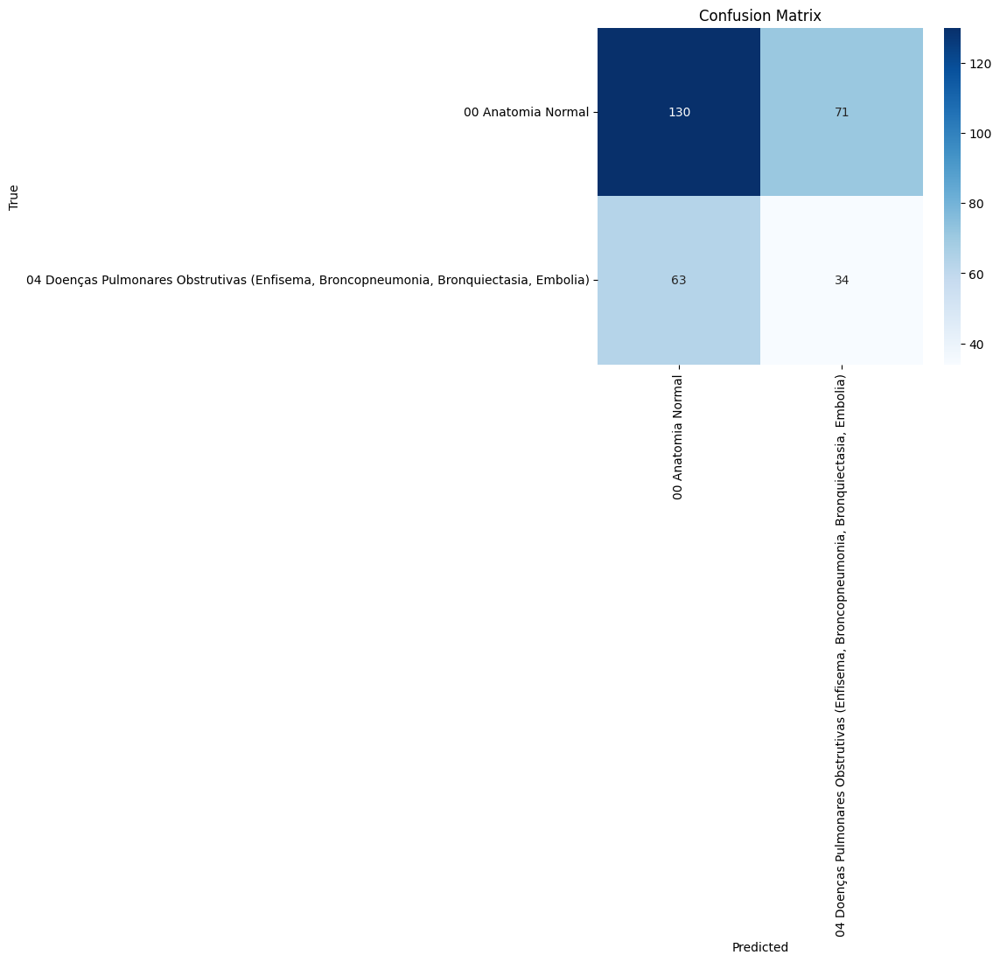

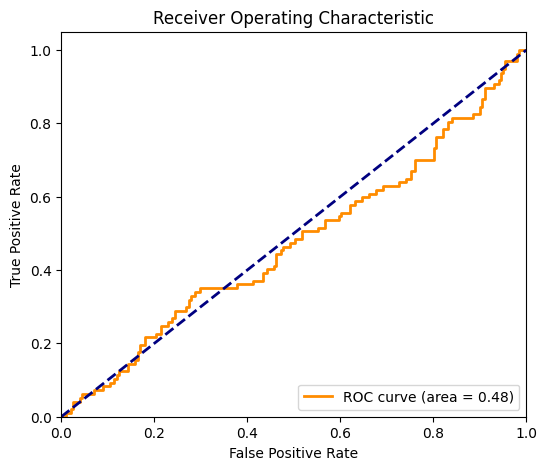

In [21]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
import seaborn as sns

# Evaluate the model on the validation set
val_loss, val_acc = model.evaluate(val_generator)
print(f"Validation Accuracy: {val_acc:.4f}, Validation Loss: {val_loss:.4f}")

# Get predictions on the validation set
y_true = val_generator.classes
y_pred_prob = model.predict(val_generator)
y_pred = (y_pred_prob > 0.5).astype(int)  # Convert probabilities to binary class predictions

# Classification Report for Precision, Recall, F1-Score
report = classification_report(y_true, y_pred)
print("Classification Report:")
print(report)

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues', xticklabels=val_generator.class_indices.keys(), yticklabels=val_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# ROC Curve and AUC (Area Under Curve)
fpr, tpr, thresholds = roc_curve(y_true, y_pred_prob)
roc_auc = roc_auc_score(y_true, y_pred_prob)

plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()


## **Define GradCAM Function**

Purpose: Highlights areas of images that most influenced the model's prediction.

In [22]:
import tensorflow as tf
import numpy as np
from tensorflow.keras import models

def grad_cam_plus_plus(model, img_array, layer_name='conv2d_5'):
    # Ensure the model is built and initialized
    model(img_array)  # This step ensures that all layers are initialized

    # Extract outputs from the specified layer
    last_conv_layer = model.get_layer(layer_name)
    grad_model = models.Model(inputs=model.input, outputs=[last_conv_layer.output, model.output])

    with tf.GradientTape(persistent=True) as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, tf.argmax(predictions[0])]

    # Capture the gradient for the output predicted class
    grads = tape.gradient(loss, conv_outputs)[0]

    # Average gradients spatially
    weights = tf.reduce_mean(grads, axis=(0, 1))
    cam = tf.reduce_sum(tf.multiply(weights, conv_outputs[0]), axis=-1)

    # Apply ReLU
    cam = tf.maximum(cam, 0)
    heatmap = (cam - tf.reduce_min(cam)) / (tf.reduce_max(cam) - tf.reduce_min(cam))

    # Get the predicted class index
    class_index = tf.argmax(predictions[0]).numpy()

    return heatmap.numpy(), class_index


In [24]:
import os

# Get the file paths from the test directory
test_dir = os.path.join(processed_output, 'test')  # Path to the test directory

# List all image files in the test directory
image_paths = []

for class_name in os.listdir(test_dir):
    class_path = os.path.join(test_dir, class_name)
    if os.path.isdir(class_path):
        # Add paths of all images in this class
        for img_name in os.listdir(class_path):
            image_paths.append(os.path.join(class_path, img_name))

# Get one image path from the list
img_path = image_paths[200]  # Change the index to pick a different image
print(f"Image path: {img_path}")


Image path: /kaggle/working/xray_split/test/00 Anatomia Normal/00 (882).jpeg


In [25]:
for layer in model.layers:
    print(layer.name)


input_layer
conv2d_1
conv2d_2
max_pooling2d_1
dropout_1
conv2d_3
max_pooling2d_2
dropout_2
conv2d_4
max_pooling2d_3
dropout_3
conv2d_5
max_pooling2d_4
dropout_4
flatten
dense_1
dropout_5
output


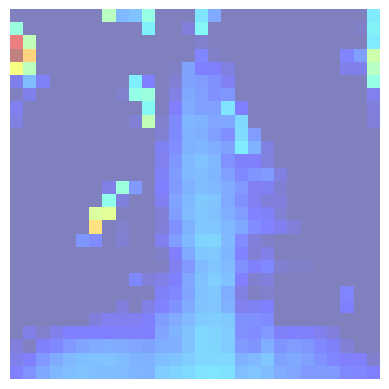

In [26]:
# Pick an image from the test set using the image path
img_path = '/kaggle/working/xray_split/test/00 Anatomia Normal/00 (882).jpeg'  # Update with the actual image path
img = tf.keras.preprocessing.image.load_img(img_path, target_size=(256, 256), color_mode='grayscale')
img_array = tf.keras.preprocessing.image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
img_array = img_array / 255.0  # Normalize the image

heatmap, class_index = grad_cam_plus_plus(model, img_array, layer_name='conv2d_5')

# Show heatmap
plt.imshow(heatmap, cmap='jet', alpha=0.5)
plt.axis('off')
plt.show()



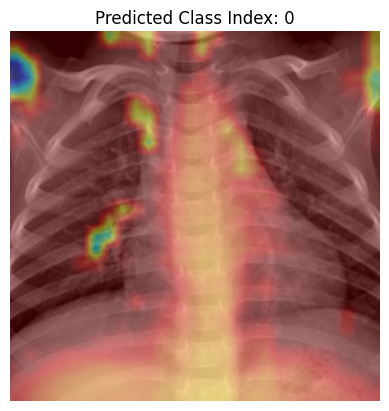

In [27]:
# Load the original image (this time it's RGB format)
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Resize heatmap to match image dimensions
heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# Convert the heatmap to RGB and normalize
heatmap_resized = np.uint8(255 * heatmap_resized)
heatmap_colored = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

# Overlay heatmap on image
superimposed_img = cv2.addWeighted(img, 0.6, heatmap_colored, 0.4, 0)

# Display the image with the predicted class label
plt.imshow(superimposed_img)
plt.axis('off')
plt.title(f"Predicted Class Index: {class_index}")  # Now using the correct class_index
plt.show()


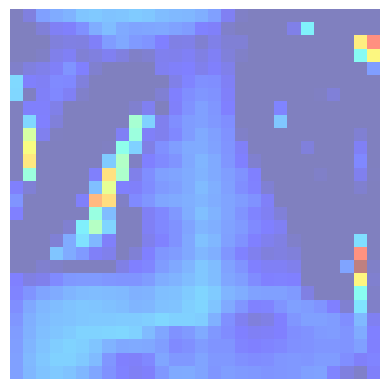

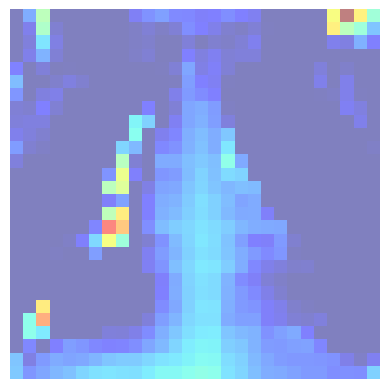

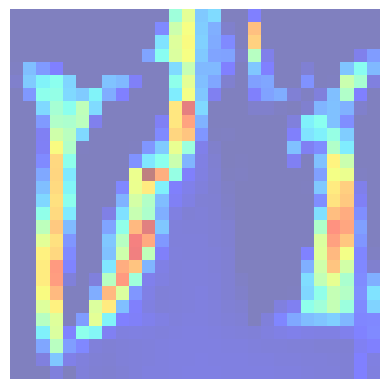

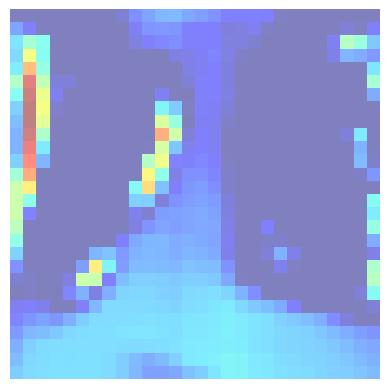

In [28]:
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# List of image paths to process (add your own paths)
image_paths = [
    '/kaggle/working/xray_split/test/00 Anatomia Normal/00 (821).jpeg',
    '/kaggle/working/xray_split/test/00 Anatomia Normal/00 (1175).jpeg',
    '/kaggle/working/xray_split/test/01 Processos Inflamatórios Pulmonares (Pneumonia)/01 (16).jpg',
    '/kaggle/working/xray_split/test/01 Processos Inflamatórios Pulmonares (Pneumonia)/01 (17).jpeg'
]

# Loop through each image path
for img_path in image_paths:
    # Load the image and preprocess
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(256, 256), color_mode='grayscale')
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = img_array / 255.0  # Normalize the image

    # Generate GradCAM++ heatmap
    heatmap, class_index = grad_cam_plus_plus(model, img_array, layer_name='conv2d_5')

    # Show heatmap
    plt.imshow(heatmap, cmap='jet', alpha=0.5)
    plt.axis('off')
    plt.show()




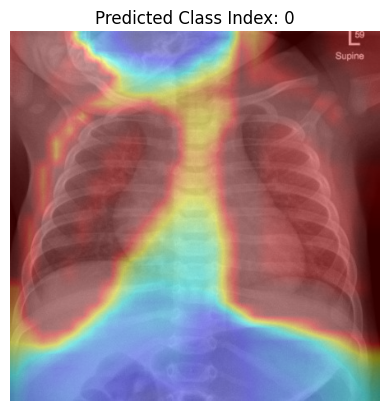

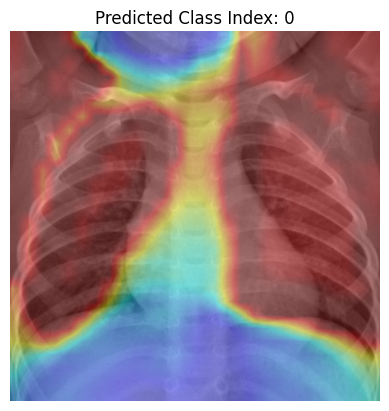

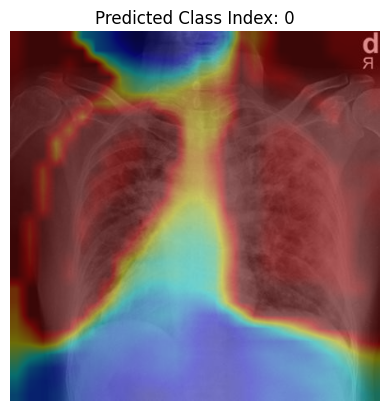

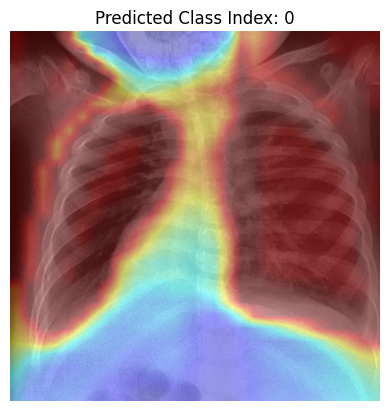

In [26]:
# Load the original image (this time it's RGB format for visualization)
for img_path in image_paths:
  img = cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Resize heatmap to match image dimensions
  heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Convert the heatmap to RGB and normalize
  heatmap_resized = np.uint8(255 * heatmap_resized)
  heatmap_colored = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

    # Overlay heatmap on image
  superimposed_img = cv2.addWeighted(img, 0.6, heatmap_colored, 0.4, 0)

    # Display the image with the predicted class label
  plt.imshow(superimposed_img)
  plt.axis('off')
  plt.title(f"Predicted Class Index: {class_index}")  # Now using the correct class_index
  plt.show()

## **interpretable models**

In [29]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=bf8d259d88f1192e36526fe7859cb99674b34078b1133728f94b59efa28cd6a0
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


Purpose: Explains predictions by segmenting images into interpretable regions (superpixels).

  0%|          | 0/500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━

  0%|          | 0/500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━

  0%|          | 0/500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━

  0%|          | 0/500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━

  0%|          | 0/500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━

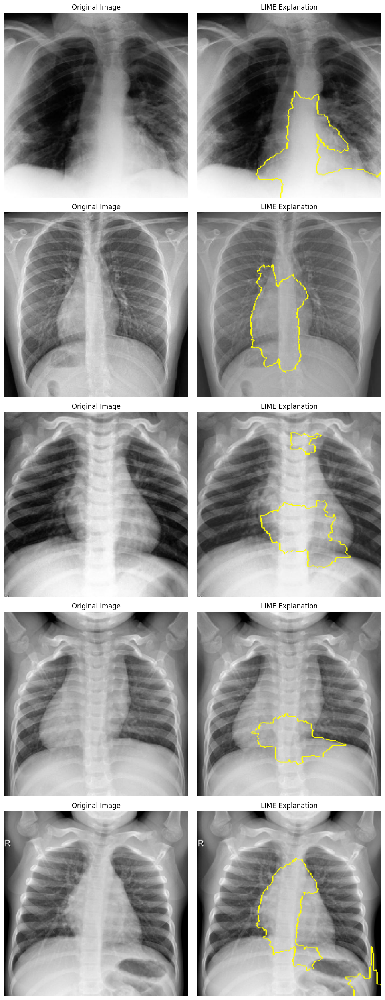

In [55]:
import numpy as np
import matplotlib.pyplot as plt
from lime.lime_image import LimeImageExplainer
from skimage.segmentation import mark_boundaries
import tensorflow as tf

# Function to convert RGB to grayscale internally for model prediction
def predict_fn(images_rgb):
    images_gray = np.dot(images_rgb[..., :3], [0.2989, 0.5870, 0.1140])
    images_gray = np.expand_dims(images_gray, axis=-1)
    return model.predict(images_gray)

# Initialize LimeImageExplainer
explainer = LimeImageExplainer()

# Get 5 images directly from your test_generator
images, labels = next(test_generator)
images = images[:5]  # Take first 5 images

fig, axes = plt.subplots(len(images), 2, figsize=(10, 5 * len(images)))

for i, img_gray in enumerate(images):
    # Convert single-channel image to RGB for LIME visualization
    img_rgb = np.repeat(img_gray, 3, axis=2)

    # Explain prediction with LIME
    explanation = explainer.explain_instance(
        img_rgb,
        predict_fn,
        top_labels=1,
        hide_color=0,
        num_samples=500
    )

    # Get mask from LIME explanation
    temp, mask = explanation.get_image_and_mask(
        explanation.top_labels[0],
        positive_only=True,
        num_features=5,
        hide_rest=False
    )

    # Plot original grayscale image
    axes[i, 0].imshow(img_gray.squeeze(), cmap='gray')
    axes[i, 0].set_title("Original Image")
    axes[i, 0].axis('off')

    # Plot LIME mask image with important features highlighted
    axes[i, 1].imshow(mark_boundaries(temp, mask))
    axes[i, 1].set_title("LIME Explanation")
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()


## **Shape**

Purpose: Provides pixel-level importance for deep CNN models.

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: input_layer
Received: inputs=['Tensor(shape=(32, 256, 256, 1))']
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: input_layer
Received: inputs=['Tensor(shape=(64, 256, 256, 1))']
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: input_layer
Received: inputs=['Tensor(shape=(1, 256, 256, 1))']
  warnings.warn(msg)


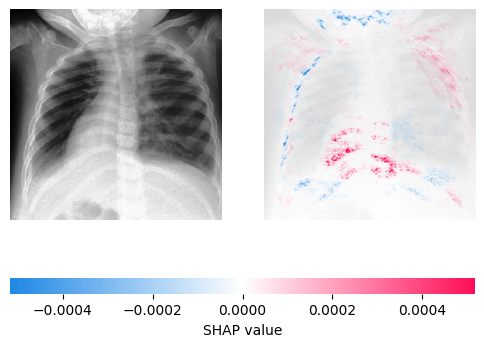

In [37]:
import shap
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Load your grayscale image as the model expects:
img = tf.keras.preprocessing.image.load_img(img_path, target_size=(256, 256), color_mode='grayscale')
img_array = tf.keras.preprocessing.image.img_to_array(img) / 255.0
img_array = np.expand_dims(img_array, axis=0)  # (1, 256, 256, 1)

# Select some background examples from the test set:
background, _ = next(test_generator)
background = background[:50]  # select 50 images as background samples for SHAP

# Initialize SHAP DeepExplainer correctly:
explainer = shap.DeepExplainer(model, background)

# Compute SHAP values (for the grayscale image):
shap_values = explainer.shap_values(img_array)

# Visualize SHAP explanations:
shap.image_plot(shap_values, img_array)


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: input_layer
Received: inputs=['Tensor(shape=(5, 256, 256, 1))']
  warnings.warn(msg)


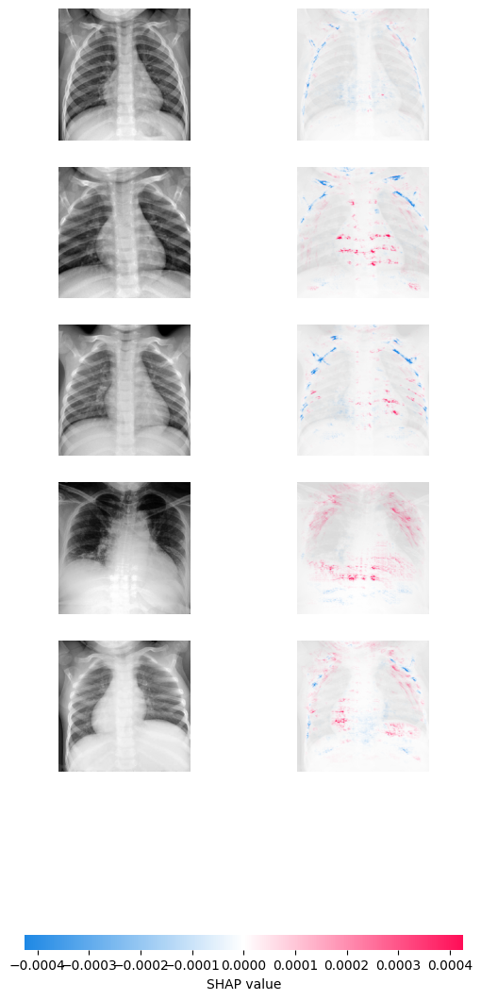

In [38]:
import shap
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Select 50 background examples from test_generator for SHAP background:
background, _ = next(test_generator)
background = background[:50]


explainer = shap.DeepExplainer(model, background)

# Select the next batch of images (5 images) from test_generator:
images, labels = next(test_generator)
images = images[:5]  # shape: (5, 256, 256, 1)

# Compute SHAP values for these 5 images:
shap_values = explainer.shap_values(images)

# Plot SHAP explanations (original grayscale images and SHAP values):
shap.image_plot(shap_values, images)


## **Saliency Maps (Gradient-based explanation)**

Purpose: Highlights pixels most sensitive to prediction changes.

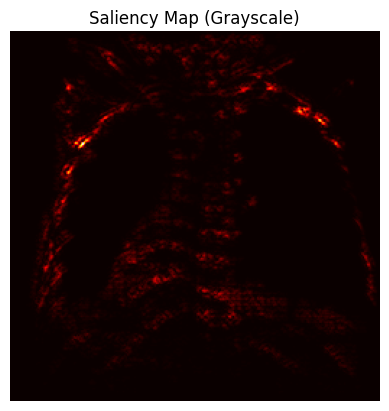

In [40]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np

# Load your image as grayscale:
img = tf.keras.preprocessing.image.load_img(img_path, target_size=(256, 256), color_mode='grayscale')
img_array = tf.keras.preprocessing.image.img_to_array(img) / 255.0
img_array = np.expand_dims(img_array, axis=0)  # shape: (1, 256, 256, 1)

def plot_saliency_map(model, img_array):
    img_tensor = tf.convert_to_tensor(img_array)
    with tf.GradientTape() as tape:
        tape.watch(img_tensor)
        preds = model(img_tensor)
        top_pred_index = tf.argmax(preds[0])
        top_class = preds[:, top_pred_index]

    grads = tape.gradient(top_class, img_tensor)
    saliency = tf.reduce_max(tf.abs(grads), axis=-1)[0]

    plt.imshow(saliency, cmap='hot')
    plt.axis('off')
    plt.title('Saliency Map (Grayscale)')
    plt.show()

# Correct Usage:
plot_saliency_map(model, img_array)


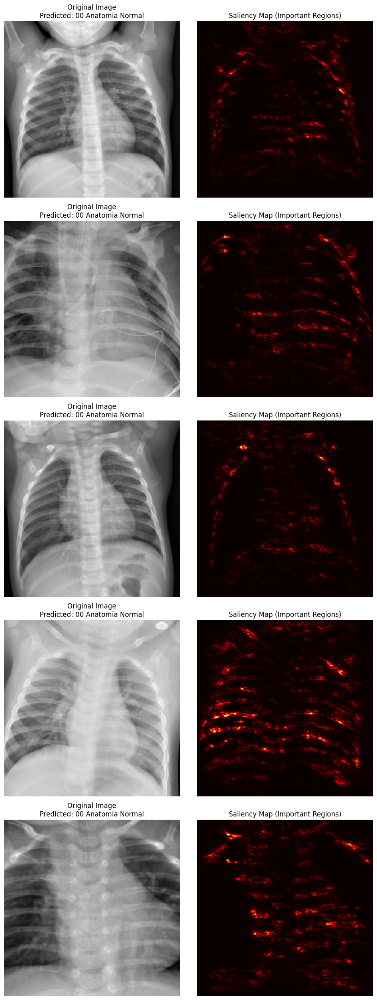

In [43]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import random

# Extract class labels from your test_generator
class_labels = {v: k for k, v in test_generator.class_indices.items()}

# Take a batch from the test_generator
images, labels = next(test_generator)

# Select 5 random images from this batch
selected_indices = random.sample(range(len(images)), 5)
selected_images = images[selected_indices]

# Saliency map function (for grayscale CNN)
def saliency_map(model, img_array):
    img_tensor = tf.convert_to_tensor(img_array)
    with tf.GradientTape() as tape:
        tape.watch(img_tensor)
        preds = model(img_tensor)
        top_pred_index = tf.argmax(preds[0])
        top_class = preds[:, top_pred_index]

    grads = tape.gradient(top_class, img_tensor)
    saliency = tf.reduce_max(tf.abs(grads), axis=-1)[0]
    return saliency.numpy(), top_pred_index.numpy()

# Plot original images with predicted class labels and saliency maps:
fig, axes = plt.subplots(5, 2, figsize=(10, 25))

for i, img in enumerate(selected_images):
    img_array = np.expand_dims(img, axis=0)

    # Generate saliency map and prediction
    saliency, pred_class_idx = saliency_map(model, img_array)
    pred_class_name = class_labels[pred_class_idx]

    # Plot original grayscale image labeled with prediction
    axes[i, 0].imshow(img.squeeze(), cmap='gray')
    axes[i, 0].set_title(f"Original Image\nPredicted: {pred_class_name}")
    axes[i, 0].axis('off')

    # Plot saliency map showing CNN focus regions
    axes[i, 1].imshow(saliency, cmap='hot')
    axes[i, 1].set_title("Saliency Map (Important Regions)")
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()


## **Integrated Gradients**

Purpose: Provides attributions to pixels by integrating gradients from baseline images.

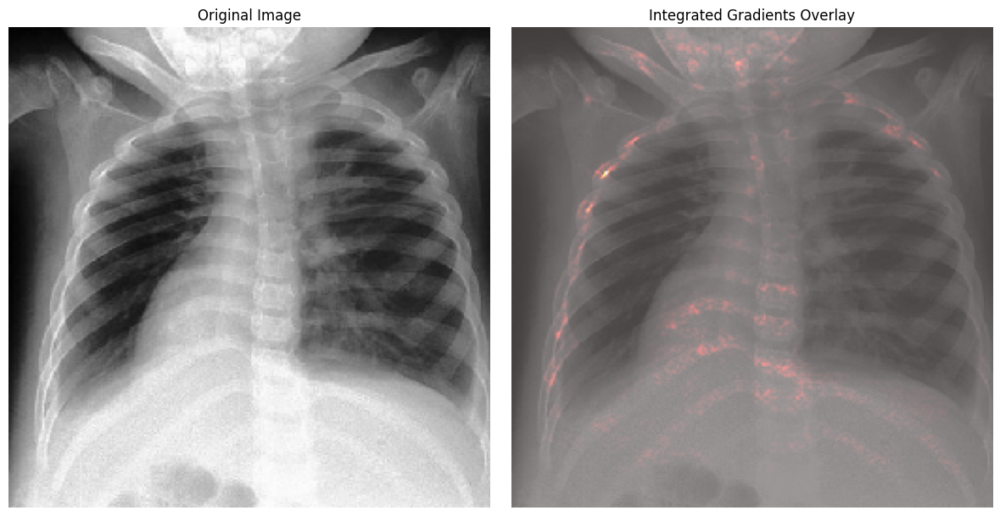

In [47]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Correct function for integrated gradients with improved scaling
def integrated_gradients(model, img_array, baseline=None, steps=50):
    if baseline is None:
        baseline = np.zeros(img_array.shape).astype(np.float32)

    # Convert to TensorFlow tensor
    img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
    baseline_tensor = tf.convert_to_tensor(baseline, dtype=tf.float32)

    # Interpolation of the image
    interpolated_images = [
        baseline_tensor + (float(i)/steps)*(img_tensor-baseline_tensor)
        for i in range(steps + 1)
    ]
    grads = []
    for interpolated_img in interpolated_images:
        with tf.GradientTape() as tape:
            tape.watch(interpolated_img)
            pred = model(interpolated_img)
            top_class = pred[:, tf.argmax(pred[0])]
        grad = tape.gradient(top_class, interpolated_img)
        grads.append(grad.numpy())

    avg_grads = np.mean(grads, axis=0)
    integrated_grads = (img_tensor - baseline_tensor) * avg_grads
    return integrated_grads.numpy()

# Example usage (image pre-processing as before)
img = tf.keras.preprocessing.image.load_img(img_path, target_size=(256, 256), color_mode='grayscale')
img_array = tf.keras.preprocessing.image.img_to_array(img) / 255.0
img_array = np.expand_dims(img_array, axis=0)  # shape: (1, 256, 256, 1)

# Calculate integrated gradients
int_grads = integrated_gradients(model, img_array)

# Normalize the integrated gradients for better visibility
int_grads = np.abs(int_grads.squeeze())  # Remove batch and channel dimensions

# Convert the image to a NumPy array (so we can apply squeeze)
img_np = np.array(img)  # Convert to numpy array
img_np = img_np.squeeze()  # Remove any unnecessary dimensions

# Plot original image and integrated gradients overlay
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Original image (grayscale)
ax[0].imshow(img_np, cmap='gray')
ax[0].set_title('Original Image')
ax[0].axis('off')

# Saliency map (Integrated Gradients) with proper scaling and overlay
ax[1].imshow(img_np, cmap='gray', alpha=0.6)  # Original image with transparency
ax[1].imshow(int_grads, cmap='hot', alpha=0.4)  # Overlay with the hot colormap
ax[1].set_title('Integrated Gradients Overlay')
ax[1].axis('off')

plt.tight_layout()
plt.show()


## **Global Interpretability Methods (Explaining Overall Model Behavior)**

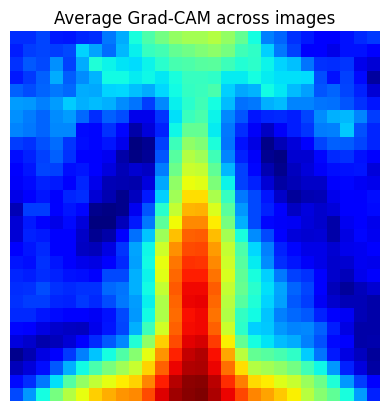

In [51]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Assuming grad_cam_plus_plus is already defined and works fine, if not, make sure it's available
# Here is an example grad_cam_plus_plus function
def grad_cam_plus_plus(model, img_array, layer_name='conv2d_5'):
    # Ensure the model is built and initialized
    model(img_array)  # This step ensures that all layers are initialized

    # Extract outputs from the specified layer
    last_conv_layer = model.get_layer(layer_name)
    grad_model = tf.keras.models.Model(inputs=model.input, outputs=[last_conv_layer.output, model.output])

    with tf.GradientTape(persistent=True) as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, tf.argmax(predictions[0])]

    # Capture the gradient for the output predicted class
    grads = tape.gradient(loss, conv_outputs)[0]

    # Average gradients spatially
    weights = tf.reduce_mean(grads, axis=(0, 1))
    cam = tf.reduce_sum(tf.multiply(weights, conv_outputs[0]), axis=-1)

    # Apply ReLU
    cam = tf.maximum(cam, 0)
    heatmap = (cam - tf.reduce_min(cam)) / (tf.reduce_max(cam) - tf.reduce_min(cam))

    # Get the predicted class index
    class_index = tf.argmax(predictions[0]).numpy()

    return heatmap.numpy(), class_index


# Define the aggregate_grad_cam function to generate the average heatmap
def aggregate_grad_cam(model, generator, num_images=50):
    heatmaps = []
    for i in range(num_images):
        # Get image and label from the generator (corrected to use `next(generator)`):
        img, label = next(generator)
        # Ensure the generator produces the right shape: (batch_size, height, width, channels)
        heatmap, _ = grad_cam_plus_plus(model, img, 'conv2d_5')
        heatmaps.append(heatmap)  # Append the individual heatmap to the list

    # Compute the average heatmap across all images
    avg_heatmap = np.mean(heatmaps, axis=0)

    # Plot the average Grad-CAM heatmap
    plt.imshow(avg_heatmap, cmap='jet')
    plt.axis('off')
    plt.title('Average Grad-CAM across images')
    plt.show()


aggregate_grad_cam(model, test_generator, num_images=50)


The function will iterate over 50 images from the test_generator.

For each image, Grad-CAM will be calculated and added to a list of heatmaps.

The final output will be a single averaged Grad-CAM heatmap, which is visualized using the jet colormap. This heatmap shows which regions of the images were most influential for the CNN’s decision.

## **2. Surrogate Models (Global Approximation)**

53/53 ━━━━━━━━━━━━━━━━━━━━ 16s 281ms/step


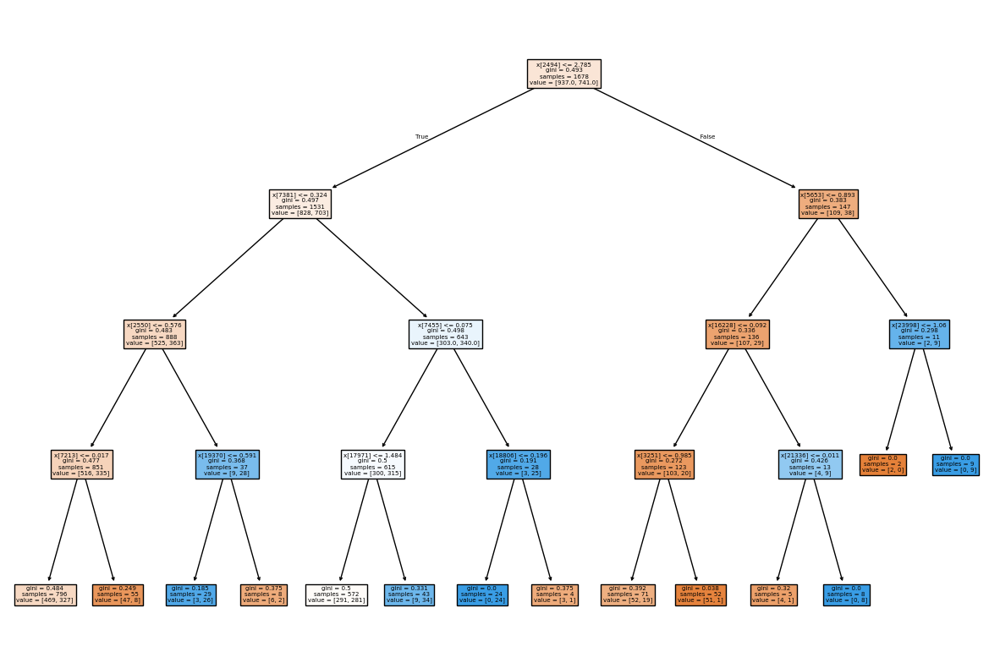

In [49]:
from sklearn.tree import DecisionTreeClassifier, plot_tree

# Extract features from CNN's intermediate layer
feature_extractor = models.Model(inputs=model.input, outputs=model.get_layer('flatten').output)
features = feature_extractor.predict(train_generator)

# Fit surrogate model
tree = DecisionTreeClassifier(max_depth=4)
tree.fit(features, train_generator.classes)

plt.figure(figsize=(15, 10))
plot_tree(tree, filled=True)
plt.show()


Use a simpler model (Decision Tree) trained on embeddings/features extracted from the CNN to globally explain predictions.

Extract features from CNN layers and fit interpretable surrogate models.

# ***MODEL 2***

https://ieeexplore.ieee.org/abstract/document/10445174

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Compact Convolutional Transformer (CCT) Model
def build_cct_model(input_shape=(256, 256, 1)):
    # Input layer
    inputs = tf.keras.Input(shape=input_shape, name='input_layer')

    # Convolutional blocks
    x = layers.Conv2D(32, (3, 3), activation='relu')(inputs)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Conv2D(64, (3, 3), activation='relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Conv2D(128, (3, 3), activation='relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Transformer block
    x = layers.Reshape((-1, 128))(x)  # Flatten the features
    x = layers.MultiHeadAttention(num_heads=4, key_dim=128)(x, x)
    x = layers.Add()([x, layers.Reshape((-1, 128))(x)])  # Skip connection
    x = layers.LayerNormalization()(x)

    # Fully connected layers
    x = layers.Flatten()(x)
    x = layers.Dense(64, activation='relu')(x)
    x = layers.Dropout(0.5)(x)

    # Output layer (binary classification)
    outputs = layers.Dense(1, activation='sigmoid')(x)

    model = models.Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    return model


In [ ]:
import cv2
import numpy as np

# Preprocessing function
def preprocess_image(image):
    # CLAHE (Contrast Limited Adaptive Histogram Equalization)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    image = clahe.apply(image)

    # Gamma correction
    gamma = 1.2
    image = np.power(image / 255.0, gamma) * 255.0

    # Bilateral filter
    image = cv2.bilateralFilter(image, 9, 75, 75)

    return image


from tensorflow.keras.preprocessing.image import ImageDataGenerator

def augment_data():
    datagen = ImageDataGenerator(
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    )
    return datagen


In [ ]:
def build_ctxnet_model(input_shape=(256, 256, 1)):
    # Start with the CCT model
    cct_model = build_cct_model(input_shape)

    return cct_model


In [ ]:

train_datagen = augment_data()

# Training the model
model = build_ctxnet_model(input_shape=(256, 256, 1))
model.summary()

model.fit(train_generator, epochs=10, validation_data=val_generator)
